![Digital Earth Pacific](dep.png)

## Digital Earth Pacific Notebook
### Soil Moisture Analysis
#### Pre- and Post-Flood Soil Moisture Assessment in Yalelevu, Ba River Catchment Using Sentinel-1 and Sentinel-2


## 1.0 Introduction

Flooding is one of the most significant natural hazards affecting agricultural productivity and land conditions within the Ba River Catchment, Fiji. Beyond visible floodwater inundation, floods can substantially alter soil moisture conditions, leading to waterlogging, reduced crop productivity, and delayed recovery of agricultural land.

This study investigates changes in soil moisture before and after a flood event in Yalelevu using a combination of Sentinel-1 SAR data and Sentinel-2 optical imagery. Soil moisture estimates are derived using Sentinel-1 VV backscatter and Sentinel-2 NDVI, while flood extent is mapped using the Normalized Difference Water Index (NDWI).

The integration of soil moisture and flood extent information provides a comprehensive assessment of flood impacts across the study area.


##  Objectives
The objectives of this notebook is to:

1. Generate a pre-flood soil moisture map.
2. Generate a post-flood soil moisture map.
3. Calculate soil moisture change following the flood.
4. Map flood extent using NDWI.
5. Identify flooded and waterlogged areas.
6. Assess potential impacts on agricultural land.

***

## 2.0 Load all the packages

In [1]:
#Import libraries
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import odc.stac
import pystac_client
from odc.stac import load
from pystac.client import Client


## 3.0 Define the study area
The study that are looking at is located in the Ba region.

In [2]:
#Yalelevu AOI imported from asset

aoi = gpd.read_file("/home/jovyan/Ba.geojson")
aoi = aoi.to_crs("EPSG:4326")
min_lon, min_lat, max_lon, max_lat = aoi.total_bounds

bbox = [min_lon, min_lat, max_lon, max_lat]

#### Display the map
The map displays the Area of Interest (AOI), highlighting the geographic region selected for analysis.

In [3]:
aoi.explore()

## 4.0 Load Sentinel 1- Data
Focusing on Pre-Flood and Post-Flood

### 4.1 Pre-Flood Imagery

In [16]:
catalog = "https://earth-search.aws.element84.com/v1"
client = Client.open(catalog)
datetime = "2024-07-01/2024-12-31"


In [17]:
items = client.search(
    collections=["sentinel-1-grd"],
    bbox=bbox,
    datetime=datetime,
    query={
        "sar:instrument_mode": {"eq": "IW"},
        "sat:orbit_state": {"eq": "ascending"},
        "s1:orbit_source": {"eq": "RESORB"}
    }
).item_collection()

In [18]:
items

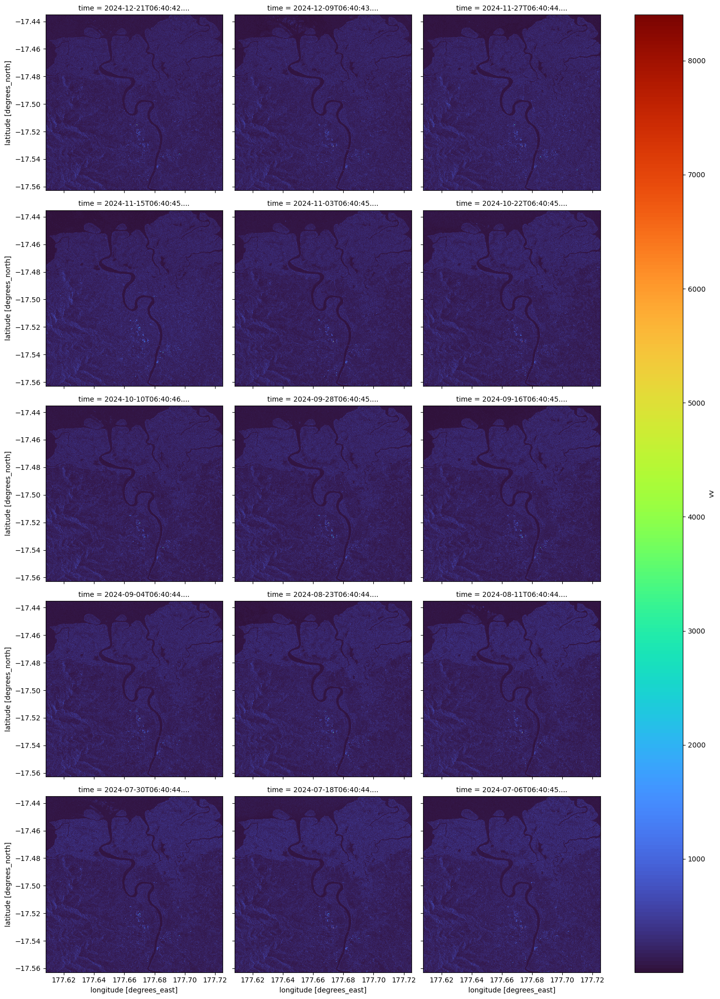

In [25]:
ds.vv.plot(
    col="time",
    col_wrap=3,
    cmap="turbo",
    figsize=(15, 20)
)

In [5]:
#Find Sentinel‑1 images where the satellite was moving ascending (south to north) and processed using RESORB orbit data, and return the results as a collection
items = client.search(
    collections=["sentinel-1-grd"],
    bbox=bbox,
    # intersects=bbox.polygon,
    datetime=datetime,
    query={"sat:orbit_state": {"eq": "ascending"},"s1:orbit_source": {"eq": "RESORB"}},  # or "ascending"
).item_collection()

print(f"Found {len(items)} items")

Found 2 items


#### 4.1.1 Load VV and VH Bands
Downloads and loads:

- VV polarization
- VH polarization

into an xarray dataset.

In [7]:
from odc.stac import load
import numpy as np
import matplotlib.pyplot as plt

ds_pre = load(
    items,
    bands=["vv", "vh"],
    bbox=bbox,
    groupby="solar_day"
)

preflood = ds_pre.median(dim="time")

vv_db = 10*np.log10(preflood.vv)
vh_db = 10*np.log10(preflood.vh)

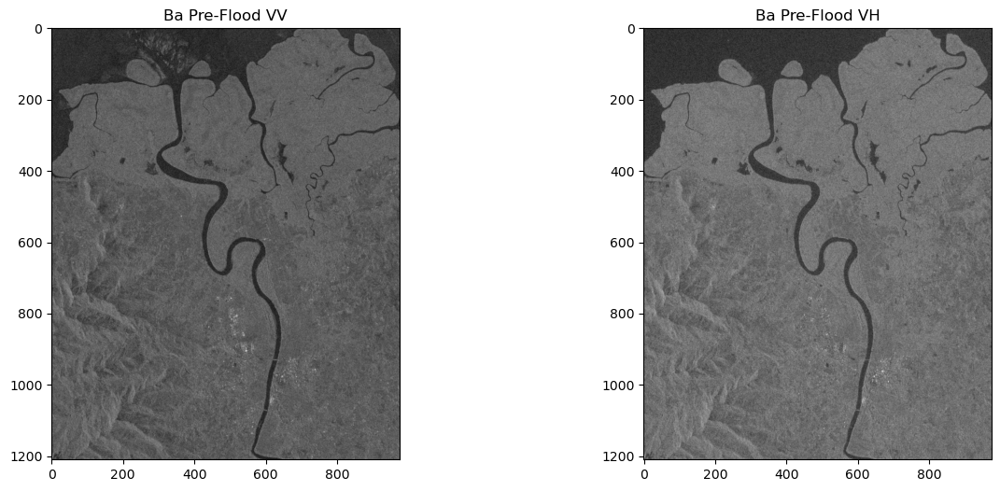

In [8]:
vh_db = 10*np.log10(preflood.vh)

fig, ax = plt.subplots(1,2, figsize=(15,6))

ax[0].imshow(vv_db.values, cmap="gray")
ax[0].set_title("Ba Pre-Flood VV")

ax[1].imshow(vh_db.values, cmap="gray")
ax[1].set_title("Ba Pre-Flood VH")

plt.show()

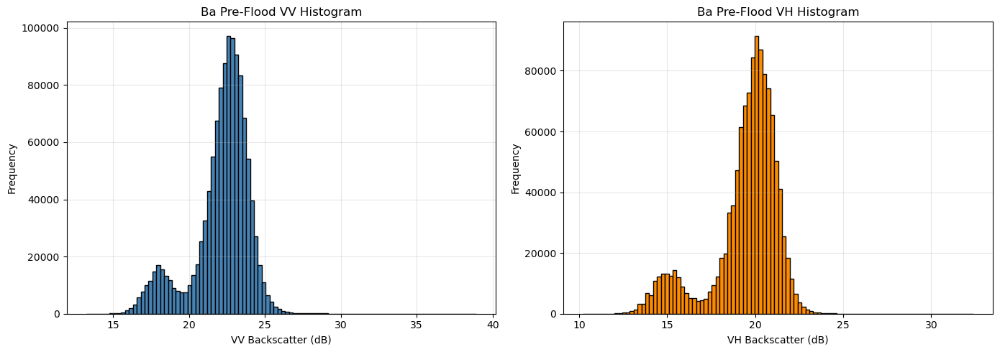

In [31]:
#Plot the histogram
# Flatten arrays and remove NaNs
vv_values = vv_db.values.flatten()
vh_values = vh_db.values.flatten()

vv_values = vv_values[~np.isnan(vv_values)]
vh_values = vh_values[~np.isnan(vh_values)]

# Plot histograms
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# VV Histogram
ax[0].hist(vv_values, bins=100, color='steelblue', edgecolor='black')
ax[0].set_title('Ba Pre-Flood VV Histogram')
ax[0].set_xlabel('VV Backscatter (dB)')
ax[0].set_ylabel('Frequency')
ax[0].grid(alpha=0.3)

# VH Histogram
ax[1].hist(vh_values, bins=100, color='darkorange', edgecolor='black')
ax[1].set_title('Ba Pre-Flood VH Histogram')
ax[1].set_xlabel('VH Backscatter (dB)')
ax[1].set_ylabel('Frequency')
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

#### Normalize the values
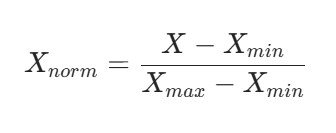

In [32]:
# Flatten and remove NaNs
vv_values = vv_db.values
vh_values = vh_db.values

# Min-Max normalization
vv_norm = (vv_values - np.nanmin(vv_values)) / (
    np.nanmax(vv_values) - np.nanmin(vv_values)
)

vh_norm = (vh_values - np.nanmin(vh_values)) / (
    np.nanmax(vh_values) - np.nanmin(vh_values)
)

print("VV range:", np.nanmin(vv_norm), np.nanmax(vv_norm))
print("VH range:", np.nanmin(vh_norm), np.nanmax(vh_norm))

VV range: 0.0 1.0
VH range: 0.0 1.0


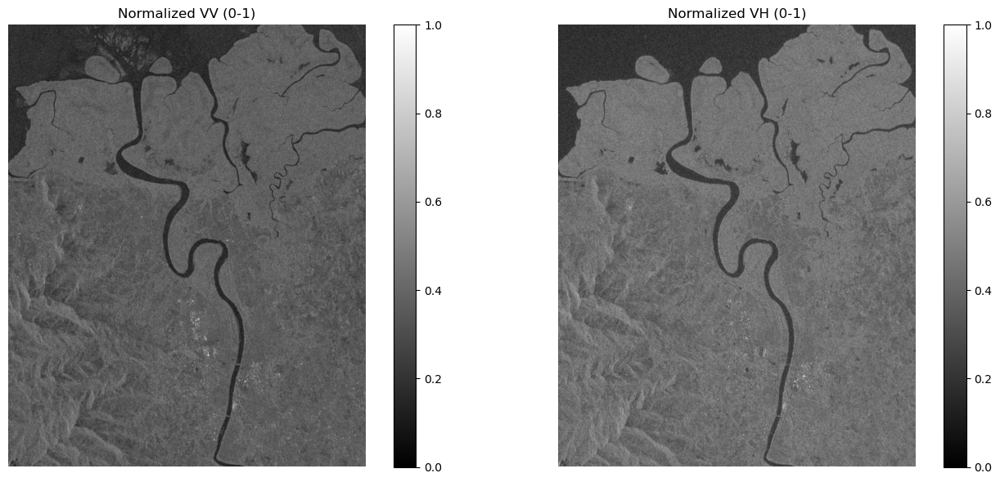

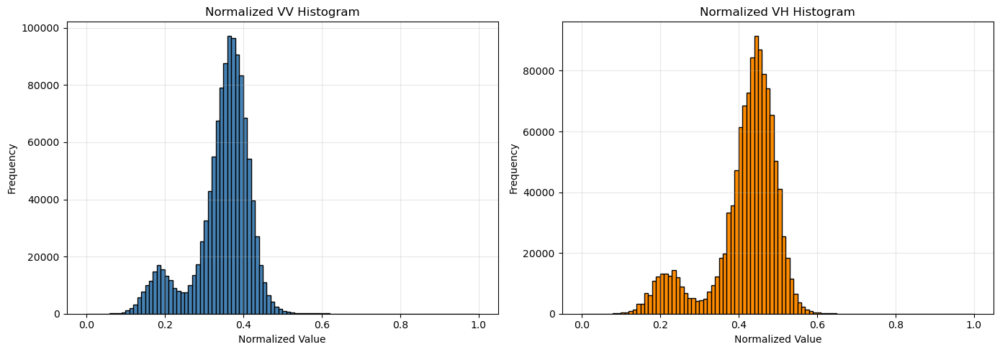

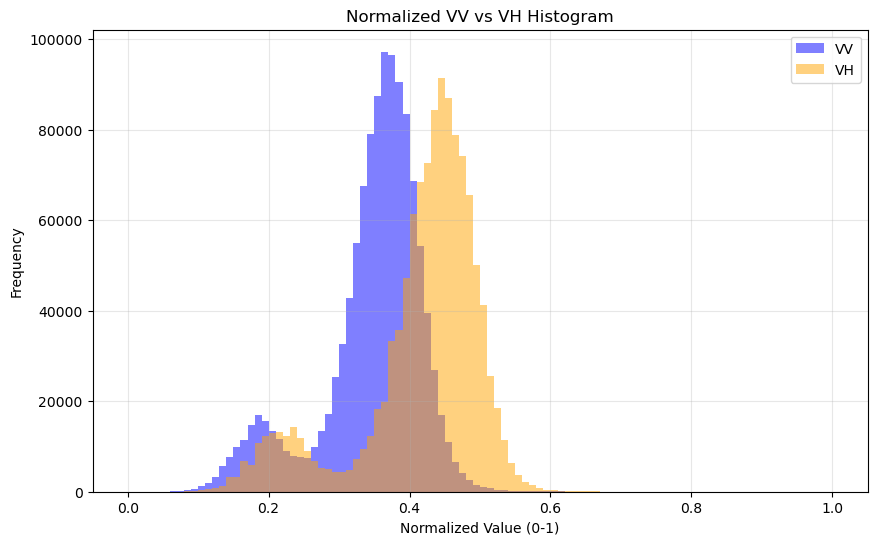

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# NORMALIZE TO 0-1
# ============================================================
vv_pre_norm = (vv_db.values - np.nanmin(vv_db.values)) / (
    np.nanmax(vv_db.values) - np.nanmin(vv_db.values)
)

vh_pre_norm = (vh_db.values - np.nanmin(vh_db.values)) / (
    np.nanmax(vh_db.values) - np.nanmin(vh_db.values)
)

# ============================================================
# PLOT NORMALIZED IMAGES
# ============================================================
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

im1 = ax[0].imshow(vv_pre_norm, cmap='gray')
ax[0].set_title('Normalized VV (0-1)')
ax[0].axis('off')
plt.colorbar(im1, ax=ax[0])

im2 = ax[1].imshow(vh_pre_norm, cmap='gray')
ax[1].set_title('Normalized VH (0-1)')
ax[1].axis('off')
plt.colorbar(im2, ax=ax[1])

plt.tight_layout()
plt.show()

# ============================================================
# HISTOGRAMS
# ============================================================
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

ax[0].hist(vv_pre_norm.flatten(),
           bins=100,
           color='steelblue',
           edgecolor='black')

ax[0].set_title('Normalized VV Histogram')
ax[0].set_xlabel('Normalized Value')
ax[0].set_ylabel('Frequency')
ax[0].grid(alpha=0.3)

ax[1].hist(vh_pre_norm.flatten(),
           bins=100,
           color='darkorange',
           edgecolor='black')

ax[1].set_title('Normalized VH Histogram')
ax[1].set_xlabel('Normalized Value')
ax[1].set_ylabel('Frequency')
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================
# OVERLAID HISTOGRAM
# ============================================================
plt.figure(figsize=(10, 6))

plt.hist(vv_pre_norm.flatten(),
         bins=100,
         alpha=0.5,
         color='blue',
         label='VV')

plt.hist(vh_pre_norm.flatten(),
         bins=100,
         alpha=0.5,
         color='orange',
         label='VH')

plt.xlabel('Normalized Value (0-1)')
plt.ylabel('Frequency')
plt.title('Normalized VV vs VH Histogram')
plt.legend()
plt.grid(alpha=0.3)

plt.show()

#### 4.1.2 Speckle Reduction

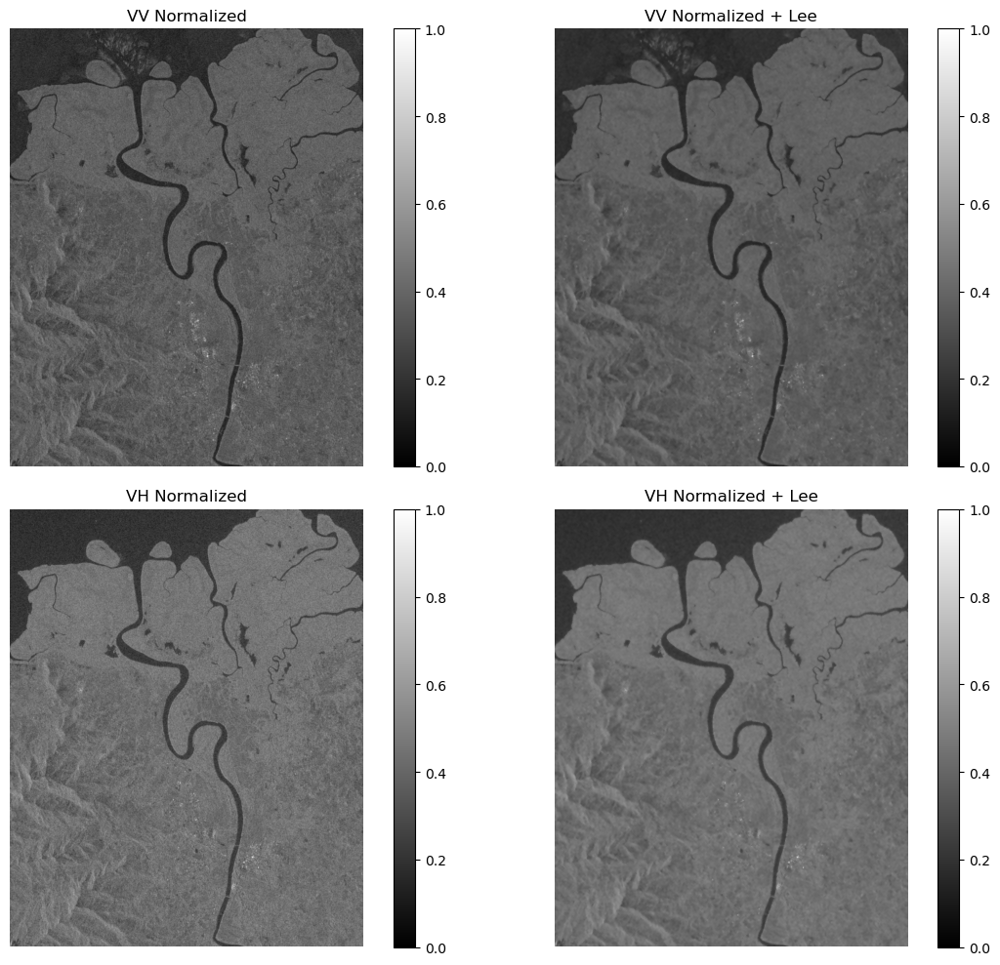

In [34]:
# ============================================================
# LEE FILTER
# ============================================================
from scipy.ndimage import uniform_filter
def lee_filter(img, window_size=5):
    mean = uniform_filter(img.astype(float), window_size)
    mean_sqr = uniform_filter(img**2, window_size)

    variance = mean_sqr - mean**2
    overall_variance = np.var(img)

    w_t = variance / (variance + overall_variance + 1e-10)

    return mean + w_t * (img - mean)

# ============================================================
# APPLY LEE FILTER
# ============================================================
vv_norm_filtered = lee_filter(vv_pre_norm, window_size=7)
vh_norm_filtered = lee_filter(vh_pre_norm, window_size=7)

# ============================================================
# PLOT COMPARISON
# ============================================================
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

im1 = ax[0,0].imshow(vv_pre_norm, cmap='gray', vmin=0, vmax=1)
ax[0,0].set_title('VV Normalized')
ax[0,0].axis('off')
plt.colorbar(im1, ax=ax[0,0])

im2 = ax[0,1].imshow(vv_norm_filtered, cmap='gray', vmin=0, vmax=1)
ax[0,1].set_title('VV Normalized + Lee')
ax[0,1].axis('off')
plt.colorbar(im2, ax=ax[0,1])

im3 = ax[1,0].imshow(vh_pre_norm, cmap='gray', vmin=0, vmax=1)
ax[1,0].set_title('VH Normalized')
ax[1,0].axis('off')
plt.colorbar(im3, ax=ax[1,0])

im4 = ax[1,1].imshow(vh_norm_filtered, cmap='gray', vmin=0, vmax=1)
ax[1,1].set_title('VH Normalized + Lee')
ax[1,1].axis('off')
plt.colorbar(im4, ax=ax[1,1])

plt.tight_layout()
plt.show()

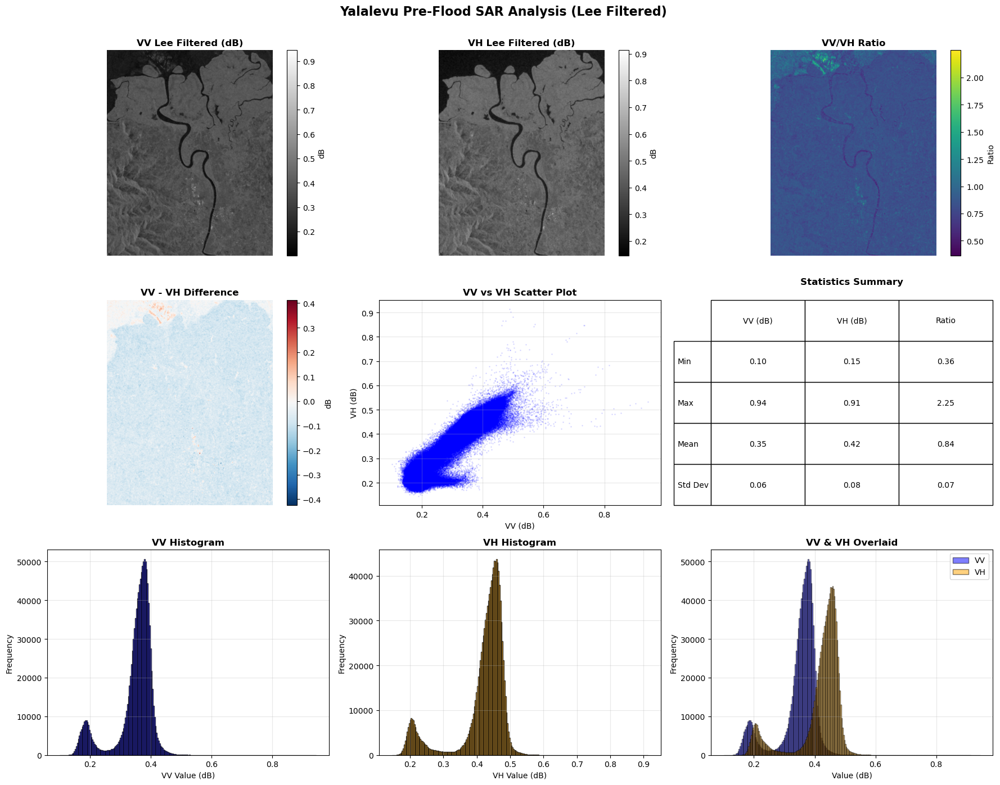


Correlation between VV and VH: 0.9465


In [35]:
#Test
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import uniform_filter

# ============================================================
# DERIVED PRODUCTS
# ============================================================
eps = 1e-6

ratio = vv_norm_filtered / (vh_norm_filtered  + eps)
difference = vv_norm_filtered  - vh_norm_filtered 

# ============================================================
# CREATE 3x3 FIGURE
# ============================================================
fig, axes = plt.subplots(3, 3, figsize=(18, 14))

# ------------------------------------------------------------
# VV Filtered
# ------------------------------------------------------------
im1 = axes[0, 0].imshow(vv_norm_filtered , cmap='gray')
axes[0, 0].set_title('VV Lee Filtered (dB)', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')
plt.colorbar(im1, ax=axes[0, 0], label='dB')

# ------------------------------------------------------------
# VH Filtered
# ------------------------------------------------------------
im2 = axes[0, 1].imshow(vh_norm_filtered , cmap='gray')
axes[0, 1].set_title('VH Lee Filtered (dB)', fontsize=12, fontweight='bold')
axes[0, 1].axis('off')
plt.colorbar(im2, ax=axes[0, 1], label='dB')

# ------------------------------------------------------------
# VV/VH Ratio
# ------------------------------------------------------------
im3 = axes[0, 2].imshow(ratio, cmap='viridis')
axes[0, 2].set_title('VV/VH Ratio', fontsize=12, fontweight='bold')
axes[0, 2].axis('off')
plt.colorbar(im3, ax=axes[0, 2], label='Ratio')

# ------------------------------------------------------------
# VV - VH Difference
# ------------------------------------------------------------
im4 = axes[1, 0].imshow(difference, cmap='RdBu_r')
axes[1, 0].set_title('VV - VH Difference', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')
plt.colorbar(im4, ax=axes[1, 0], label='dB')

# ------------------------------------------------------------
# Scatter Plot
# ------------------------------------------------------------
axes[1, 1].scatter(
    vv_norm_filtered .flatten(),
    vh_norm_filtered .flatten(),
    alpha=0.1,
    s=1,
    c='blue'
)

axes[1, 1].set_xlabel('VV (dB)')
axes[1, 1].set_ylabel('VH (dB)')
axes[1, 1].set_title('VV vs VH Scatter Plot',
                     fontsize=12,
                     fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)

# ------------------------------------------------------------
# Statistics Table
# ------------------------------------------------------------
axes[1, 2].axis('off')

stats = pd.DataFrame({
    'VV (dB)': [
        f"{vv_norm_filtered .min():.2f}",
        f"{vv_norm_filtered .max():.2f}",
        f"{vv_norm_filtered .mean():.2f}",
        f"{vv_norm_filtered .std():.2f}"
    ],
    'VH (dB)': [
        f"{vh_norm_filtered.min():.2f}",
        f"{vh_norm_filtered.max():.2f}",
        f"{vh_norm_filtered.mean():.2f}",
        f"{vh_norm_filtered.std():.2f}"
    ],
    'Ratio': [
        f"{ratio.min():.2f}",
        f"{ratio.max():.2f}",
        f"{ratio.mean():.2f}",
        f"{ratio.std():.2f}"
    ]
}, index=['Min', 'Max', 'Mean', 'Std Dev'])

table = axes[1, 2].table(
    cellText=stats.values,
    colLabels=stats.columns,
    rowLabels=stats.index,
    cellLoc='center',
    loc='center',
    bbox=[0, 0, 1, 1]
)

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2)

axes[1, 2].set_title(
    'Statistics Summary',
    fontsize=12,
    fontweight='bold',
    pad=20
)

# ------------------------------------------------------------
# VV Histogram
# ------------------------------------------------------------
axes[2, 0].hist(
    vv_norm_filtered.flatten(),
    bins=256,
    color='blue',
    alpha=0.7,
    edgecolor='black'
)

axes[2, 0].set_xlabel('VV Value (dB)')
axes[2, 0].set_ylabel('Frequency')
axes[2, 0].set_title('VV Histogram',
                     fontsize=12,
                     fontweight='bold')
axes[2, 0].grid(True, alpha=0.3)

# ------------------------------------------------------------
# VH Histogram
# ------------------------------------------------------------
axes[2, 1].hist(
   vh_norm_filtered.flatten(),
    bins=256,
    color='orange',
    alpha=0.7,
    edgecolor='black'
)

axes[2, 1].set_xlabel('VH Value (dB)')
axes[2, 1].set_ylabel('Frequency')
axes[2, 1].set_title('VH Histogram',
                     fontsize=12,
                     fontweight='bold')
axes[2, 1].grid(True, alpha=0.3)

# ------------------------------------------------------------
# Combined Histogram
# ------------------------------------------------------------
axes[2, 2].hist(
    vv_norm_filtered.flatten(),
    bins=256,
    alpha=0.5,
    color='blue',
    label='VV',
    edgecolor='black'
)

axes[2, 2].hist(
    vh_norm_filtered.flatten(),
    bins=256,
    alpha=0.5,
    color='orange',
    label='VH',
    edgecolor='black'
)

axes[2, 2].set_xlabel('Value (dB)')
axes[2, 2].set_ylabel('Frequency')
axes[2, 2].set_title('VV & VH Overlaid',
                     fontsize=12,
                     fontweight='bold')
axes[2, 2].legend()
axes[2, 2].grid(True, alpha=0.3)

# ============================================================
# OVERALL TITLE
# ============================================================
fig.suptitle(
    'Yalalevu Pre-Flood SAR Analysis (Lee Filtered)',
    fontsize=16,
    fontweight='bold',
    y=0.995
)

plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

# ============================================================
# CORRELATION
# ============================================================
correlation = np.corrcoef(
    vv_norm_filtered.flatten(),
    vh_norm_filtered.flatten()
)[0, 1]

print(f"\nCorrelation between VV and VH: {correlation:.4f}")

#### What each plots mean?
- VV is 7.74 dB stronger than VH on average — VV more sensitive to surface characteristics

- Channels are highly correlated (R=0.97) — They respond to the same features; use ratio/difference for analysis, not individual channels

- Distinct surface features visible:
 i. River/water body = dark diagonal line (low backscatter)
 ii.Vegetation/rough terrain = bright areas (high backscatter)

- Homogeneous pre-flood baseline — Consistent statistics make post-flood changes detectable

- VV/VH ratio reveals scattering mechanism — High ratios indicate smooth surfaces (water); low ratios indicate rough/vegetated surfaces

### 4.2 Post-Flood Imagery

In [36]:
#Post-Flood
catalog = "https://earth-search.aws.element84.com/v1"
client = Client.open(catalog)
datetime = "2025-01-01/2025-01-31"

#Find Sentinel‑1 images where the satellite was moving ascending (south to north) and processed using RESORB orbit data, and return the results as a collection
items_1 = client.search(
    collections=["sentinel-1-grd"],
    bbox=bbox,
    # intersects=bbox.polygon,
    datetime=datetime,
    query={"sat:orbit_state": {"eq": "ascending"},"s1:orbit_source": {"eq": "RESORB"}},  # or "ascending"
).item_collection()

print(f"Found {len(items)} items")

Found 2 items


#### 4.2.1 Load VH and VV Backscatter for post-flood

VV polarization
VH polarization
into an xarray dataset.

In [37]:
items_1

In [38]:
from odc.stac import load

ds_post = load(
    items_1,
    bands=["vv", "vh"],
    bbox=bbox,
    groupby="solar_day"
)

In [39]:
# Load post-flood data
ds_post_median = ds_post.median(dim='time') 

vv_post_array = ds_post['vv'].values
vh_post_array = ds_post['vh'].values

# Convert to dB
vv_post_db = 10 * np.log10(vv_post_array)
vh_post_db = 10 * np.log10(vh_post_array)

In [40]:
#### Same steps in preflood analysis
#Normalse the data

# Min-Max normalization
vv_post_norm = (vv_post - np.nanmin(vv_post)) / (
    np.nanmax(vv_post) - np.nanmin(vv_post)
)

vh_post_norm = (vh_post - np.nanmin(vh_post)) / (
    np.nanmax(vh_post) - np.nanmin(vh_post)
)

NameError: name 'vv_post' is not defined

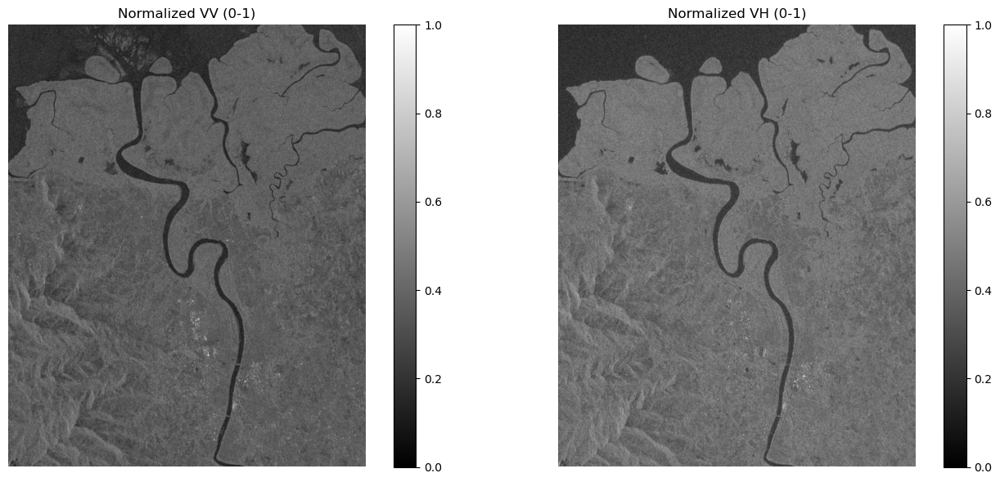

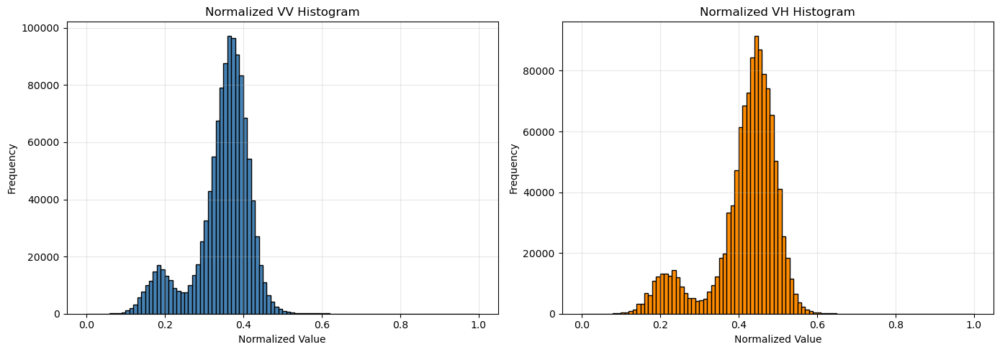

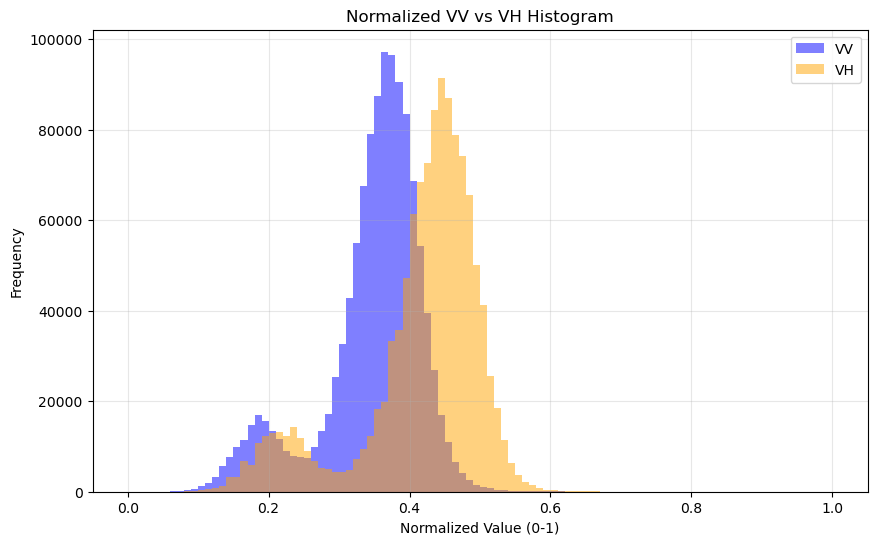

In [41]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# NORMALIZE TO 0-1
# ============================================================
vv_post_norm = (vv_db.values - np.nanmin(vv_db.values)) / (
    np.nanmax(vv_db.values) - np.nanmin(vv_db.values)
)

vh_post_norm = (vh_db.values - np.nanmin(vh_db.values)) / (
    np.nanmax(vh_db.values) - np.nanmin(vh_db.values)
)

# ============================================================
# PLOT NORMALIZED IMAGES
# ============================================================
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

im1 = ax[0].imshow(vv_post_norm, cmap='gray')
ax[0].set_title('Normalized VV (0-1)')
ax[0].axis('off')
plt.colorbar(im1, ax=ax[0])

im2 = ax[1].imshow(vh_post_norm, cmap='gray')
ax[1].set_title('Normalized VH (0-1)')
ax[1].axis('off')
plt.colorbar(im2, ax=ax[1])

plt.tight_layout()
plt.show()

# ============================================================
# HISTOGRAMS
# ============================================================
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

ax[0].hist(vv_post_norm.flatten(),
           bins=100,
           color='steelblue',
           edgecolor='black')

ax[0].set_title('Normalized VV Histogram')
ax[0].set_xlabel('Normalized Value')
ax[0].set_ylabel('Frequency')
ax[0].grid(alpha=0.3)

ax[1].hist(vh_post_norm.flatten(),
           bins=100,
           color='darkorange',
           edgecolor='black')

ax[1].set_title('Normalized VH Histogram')
ax[1].set_xlabel('Normalized Value')
ax[1].set_ylabel('Frequency')
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================
# OVERLAID HISTOGRAM
# ============================================================
plt.figure(figsize=(10, 6))

plt.hist(vv_post_norm.flatten(),
         bins=100,
         alpha=0.5,
         color='blue',
         label='VV')

plt.hist(vh_post_norm.flatten(),
         bins=100,
         alpha=0.5,
         color='orange',
         label='VH')

plt.xlabel('Normalized Value (0-1)')
plt.ylabel('Frequency')
plt.title('Normalized VV vs VH Histogram')
plt.legend()
plt.grid(alpha=0.3)

plt.show()

#### 4.2.2 Applying Lee filter to reduce noise

In [42]:
vv_post_db = 10 * np.log10(postflood.vv)
vh_post_db = 10 * np.log10(postflood.vh)

NameError: name 'postflood' is not defined

In [43]:
import numpy as np
from scipy.ndimage import uniform_filter

def lee_filter(img, size=7):

    img_mean = uniform_filter(img, size)
    img_sqr_mean = uniform_filter(img**2, size)

    img_variance = img_sqr_mean - img_mean**2

    overall_variance = np.nanmean(img_variance)

    weights = img_variance / (img_variance + overall_variance + 1e-12)
    
    filtered = img_mean + weights * (img - img_mean)

    return filtered


In [44]:
vv_post_lee = lee_filter(vv_post_norm, size=7)
vh_post_lee = lee_filter(vh_post_norm, size=7)

#vh_change_lee = vh_post_lee - vh_pre_lee

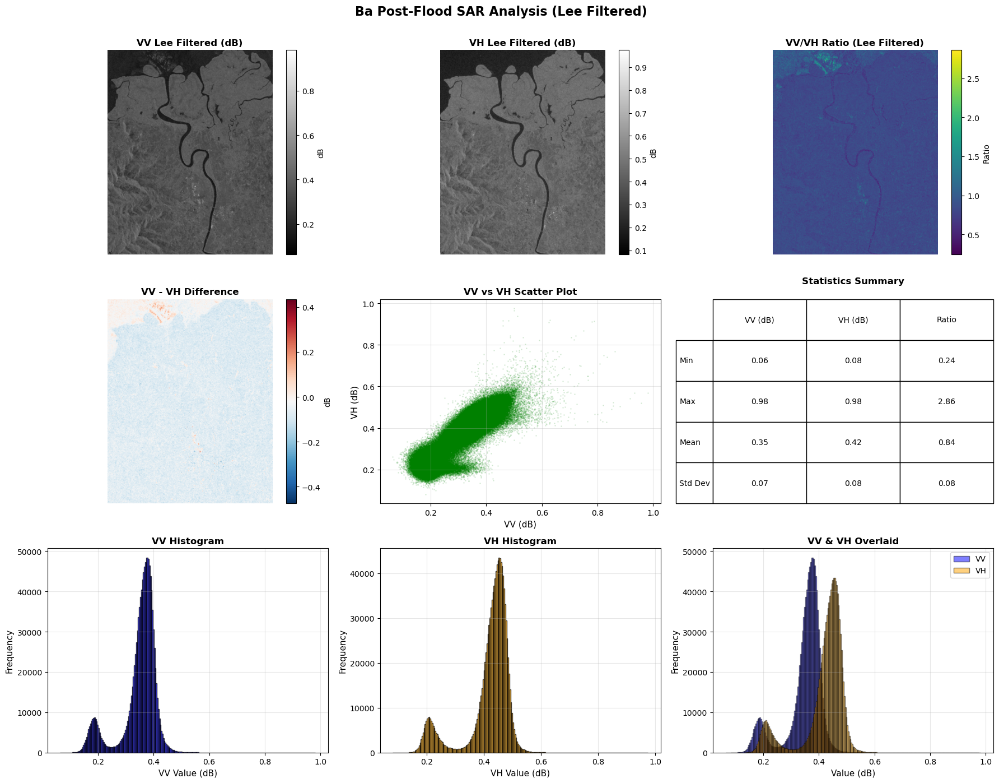


Correlation between VV and VH (Post-Flood Lee Filtered): 0.9156


In [45]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import uniform_filter

# ============================================================
# DERIVED PRODUCTS
# ============================================================
eps = 1e-6

ratio_post = vv_post_lee / (vh_post_lee + eps)
difference_post = vv_post_lee - vh_post_lee

# ============================================================
# CREATE 3x3 FIGURE
# ============================================================
fig, axes = plt.subplots(3, 3, figsize=(18, 14))

# ------------------------------------------------------------
# VV FILTERED
# ------------------------------------------------------------
im1 = axes[0, 0].imshow(vv_post_lee, cmap='gray')
axes[0, 0].set_title('VV Lee Filtered (dB)', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')
plt.colorbar(im1, ax=axes[0, 0], label='dB')

# ------------------------------------------------------------
# VH FILTERED
# ------------------------------------------------------------
im2 = axes[0, 1].imshow(vh_post_lee, cmap='gray')
axes[0, 1].set_title('VH Lee Filtered (dB)', fontsize=12, fontweight='bold')
axes[0, 1].axis('off')
plt.colorbar(im2, ax=axes[0, 1], label='dB')

# ------------------------------------------------------------
# VV/VH RATIO
# ------------------------------------------------------------
im3 = axes[0, 2].imshow(ratio_post, cmap='viridis')
axes[0, 2].set_title('VV/VH Ratio (Lee Filtered)', fontsize=12, fontweight='bold')
axes[0, 2].axis('off')
plt.colorbar(im3, ax=axes[0, 2], label='Ratio')

# ------------------------------------------------------------
# VV - VH DIFFERENCE
# ------------------------------------------------------------
im4 = axes[1, 0].imshow(difference_post, cmap='RdBu_r')
axes[1, 0].set_title('VV - VH Difference', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')
plt.colorbar(im4, ax=axes[1, 0], label='dB')

# ------------------------------------------------------------
# SCATTER PLOT
# ------------------------------------------------------------
axes[1, 1].scatter(
    vv_post_lee.flatten(),
    vh_post_lee.flatten(),
    alpha=0.1,
    s=1,
    c='green'
)

axes[1, 1].set_xlabel('VV (dB)', fontsize=11)
axes[1, 1].set_ylabel('VH (dB)', fontsize=11)
axes[1, 1].set_title(
    'VV vs VH Scatter Plot',
    fontsize=12,
    fontweight='bold'
)
axes[1, 1].grid(True, alpha=0.3)

# ------------------------------------------------------------
# STATISTICS TABLE
# ------------------------------------------------------------
axes[1, 2].axis('off')

stats = pd.DataFrame({
    'VV (dB)': [
        f"{vv_post_lee.min():.2f}",
        f"{vv_post_lee.max():.2f}",
        f"{vv_post_lee.mean():.2f}",
        f"{vv_post_lee.std():.2f}"
    ],
    'VH (dB)': [
        f"{vh_post_lee.min():.2f}",
        f"{vh_post_lee.max():.2f}",
        f"{vh_post_lee.mean():.2f}",
        f"{vh_post_lee.std():.2f}"
    ],
    'Ratio': [
        f"{ratio_post.min():.2f}",
        f"{ratio_post.max():.2f}",
        f"{ratio_post.mean():.2f}",
        f"{ratio_post.std():.2f}"
    ]
}, index=['Min', 'Max', 'Mean', 'Std Dev'])

table = axes[1, 2].table(
    cellText=stats.values,
    colLabels=stats.columns,
    rowLabels=stats.index,
    cellLoc='center',
    loc='center',
    bbox=[0, 0, 1, 1]
)

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2)

axes[1, 2].set_title(
    'Statistics Summary',
    fontsize=12,
    fontweight='bold',
    pad=20
)

# ------------------------------------------------------------
# VV HISTOGRAM
# ------------------------------------------------------------
axes[2, 0].hist(
    vv_post_lee.flatten(),
    bins=256,
    alpha=0.7,
    color='blue',
    edgecolor='black'
)

axes[2, 0].set_xlabel('VV Value (dB)', fontsize=11)
axes[2, 0].set_ylabel('Frequency', fontsize=11)
axes[2, 0].set_title(
    'VV Histogram',
    fontsize=12,
    fontweight='bold'
)
axes[2, 0].grid(True, alpha=0.3)

# ------------------------------------------------------------
# VH HISTOGRAM
# ------------------------------------------------------------
axes[2, 1].hist(
    vh_post_lee.flatten(),
    bins=256,
    alpha=0.7,
    color='orange',
    edgecolor='black'
)

axes[2, 1].set_xlabel('VH Value (dB)', fontsize=11)
axes[2, 1].set_ylabel('Frequency', fontsize=11)
axes[2, 1].set_title(
    'VH Histogram',
    fontsize=12,
    fontweight='bold'
)
axes[2, 1].grid(True, alpha=0.3)

# ------------------------------------------------------------
# COMBINED HISTOGRAM
# ------------------------------------------------------------
axes[2, 2].hist(
    vv_post_lee.flatten(),
    bins=256,
    alpha=0.5,
    label='VV',
    color='blue',
    edgecolor='black'
)

axes[2, 2].hist(
    vh_post_lee.flatten(),
    bins=256,
    alpha=0.5,
    label='VH',
    color='orange',
    edgecolor='black'
)

axes[2, 2].set_xlabel('Value (dB)', fontsize=11)
axes[2, 2].set_ylabel('Frequency', fontsize=11)
axes[2, 2].set_title(
    'VV & VH Overlaid',
    fontsize=12,
    fontweight='bold'
)
axes[2, 2].legend(fontsize=10)
axes[2, 2].grid(True, alpha=0.3)

# ============================================================
# OVERALL TITLE
# ============================================================
fig.suptitle(
    'Ba Post-Flood SAR Analysis (Lee Filtered)',
    fontsize=16,
    fontweight='bold',
    y=0.995
)

plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

# ============================================================
# CORRELATION
# ============================================================
correlation_post = np.corrcoef(
    vv_post_lee.flatten(),
    vh_post_lee.flatten()
)[0, 1]

print(f"\nCorrelation between VV and VH (Post-Flood Lee Filtered): {correlation_post:.4f}")

### 4.3 Comparing the two Flood events

- Assess the differences in flood extent and the resulting changes across the study area.
- Examine the pre-flood and post-flood satellite imagery, areas that experienced significant changes could be identified, providing an overall understanding of the spatial impact and severity of each flood event.


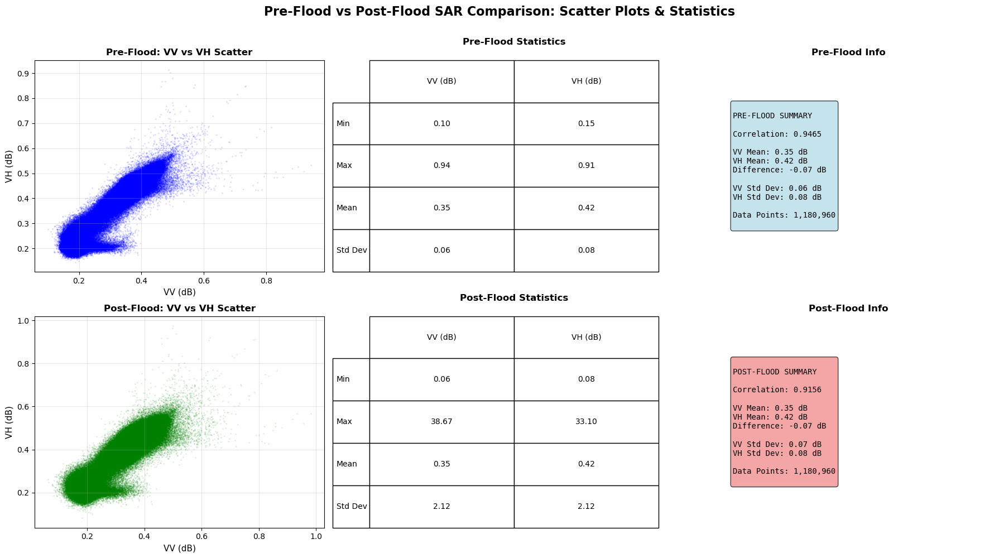


PRE-FLOOD vs POST-FLOOD CHANGES
VV Mean Change: 0.00 dB
VH Mean Change: 0.00 dB
VV Std Dev Change: 0.00 dB
VH Std Dev Change: 0.00 dB
Correlation Change: -0.0309


In [46]:


# ============================================================
# COMPARISON PLOT
# ============================================================
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# ============================================================
# TOP ROW: PRE-FLOOD
# ============================================================

# Pre-flood scatter
axes[0, 0].scatter(vv_norm_filtered.flatten(), vh_norm_filtered.flatten(), alpha=0.1, s=1, c='blue')
axes[0, 0].set_xlabel('VV (dB)', fontsize=11)
axes[0, 0].set_ylabel('VH (dB)', fontsize=11)
axes[0, 0].set_title('Pre-Flood: VV vs VH Scatter', fontsize=12, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)

# Pre-flood statistics table
axes[0, 1].axis('off')
stats_pre = pd.DataFrame({
    'VV (dB)': [f"{vv_norm_filtered.min():.2f}", f"{vv_norm_filtered.max():.2f}", 
                f"{vv_norm_filtered.mean():.2f}", f"{vv_norm_filtered.std():.2f}"],
    'VH (dB)': [f"{vh_norm_filtered.min():.2f}", f"{vh_norm_filtered.max():.2f}", 
                f"{vh_norm_filtered.mean():.2f}", f"{vh_norm_filtered.std():.2f}"]
}, index=['Min', 'Max', 'Mean', 'Std Dev'])

table_pre = axes[0, 1].table(cellText=stats_pre.values, colLabels=stats_pre.columns, 
                             rowLabels=stats_pre.index, cellLoc='center', loc='center',
                             bbox=[0, 0, 1, 1])
table_pre.auto_set_font_size(False)
table_pre.set_fontsize(10)
table_pre.scale(1, 2)
axes[0, 1].set_title('Pre-Flood Statistics', fontsize=12, fontweight='bold', pad=20)

# Pre-flood correlation
corr_pre = np.corrcoef(vv_norm_filtered.flatten(), vh_norm_filtered.flatten())[0, 1]
axes[0, 2].axis('off')
pre_info_text = f"""
PRE-FLOOD SUMMARY

Correlation: {corr_pre:.4f}

VV Mean: {vv_norm_filtered.mean():.2f} dB
VH Mean: {vh_norm_filtered.mean():.2f} dB
Difference: {vv_norm_filtered.mean() - vh_post_lee.mean():.2f} dB

VV Std Dev: {vv_norm_filtered.std():.2f} dB
VH Std Dev: {vh_norm_filtered.std():.2f} dB

Data Points: {vv_norm_filtered.size:,}
"""
axes[0, 2].text(0.1, 0.5, pre_info_text, fontsize=10, family='monospace',
                verticalalignment='center', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))
axes[0, 2].set_title('Pre-Flood Info', fontsize=12, fontweight='bold')

# ============================================================
# BOTTOM ROW: POST-FLOOD
# ============================================================

# Post-flood scatter
axes[1, 0].scatter(vv_post_lee.flatten(), vh_post_lee.flatten(), alpha=0.1, s=1, c='green')
axes[1, 0].set_xlabel('VV (dB)', fontsize=11)
axes[1, 0].set_ylabel('VH (dB)', fontsize=11)
axes[1, 0].set_title('Post-Flood: VV vs VH Scatter', fontsize=12, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# Post-flood statistics table
axes[1, 1].axis('off')
stats_post = pd.DataFrame({
    'VV (dB)': [f"{vv_post_lee.min():.2f}", f"{vv_post_db.max():.2f}", 
                f"{vv_post_lee.mean():.2f}", f"{vv_post_db.std():.2f}"],
    'VH (dB)': [f"{vh_post_lee.min():.2f}", f"{vh_post_db.max():.2f}", 
                f"{vh_post_lee.mean():.2f}", f"{vh_post_db.std():.2f}"]
}, index=['Min', 'Max', 'Mean', 'Std Dev'])

table_post = axes[1, 1].table(cellText=stats_post.values, colLabels=stats_post.columns, 
                              rowLabels=stats_post.index, cellLoc='center', loc='center',
                              bbox=[0, 0, 1, 1])
table_post.auto_set_font_size(False)
table_post.set_fontsize(10)
table_post.scale(1, 2)
axes[1, 1].set_title('Post-Flood Statistics', fontsize=12, fontweight='bold', pad=20)

# Post-flood correlation
corr_post = np.corrcoef(vv_post_lee.flatten(), vh_post_lee.flatten())[0, 1]
axes[1, 2].axis('off')
post_info_text = f"""
POST-FLOOD SUMMARY

Correlation: {corr_post:.4f}

VV Mean: {vv_post_lee.mean():.2f} dB
VH Mean: {vh_post_lee.mean():.2f} dB
Difference: {vv_post_lee.mean() - vh_post_lee.mean():.2f} dB

VV Std Dev: {vv_post_lee.std():.2f} dB
VH Std Dev: {vh_post_lee.std():.2f} dB

Data Points: {vv_post_lee.size:,}
"""
axes[1, 2].text(0.1, 0.5, post_info_text, fontsize=10, family='monospace',
                verticalalignment='center', bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.7))
axes[1, 2].set_title('Post-Flood Info', fontsize=12, fontweight='bold')

fig.suptitle('Pre-Flood vs Post-Flood SAR Comparison: Scatter Plots & Statistics', 
             fontsize=16, fontweight='bold', y=0.995)

plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

# Print change metrics
print("\n" + "="*60)
print("PRE-FLOOD vs POST-FLOOD CHANGES")
print("="*60)
print(f"VV Mean Change: {vv_post_lee.mean() - vv_norm_filtered.mean():.2f} dB")
print(f"VH Mean Change: {vh_post_lee.mean() - vh_norm_filtered.mean():.2f} dB")
print(f"VV Std Dev Change: {vv_post_lee.std() - vv_norm_filtered.std():.2f} dB")
print(f"VH Std Dev Change: {vh_post_lee.std() - vh_norm_filtered.std():.2f} dB")
print(f"Correlation Change: {corr_post - corr_pre:.4f}")
print("="*60)

Pre-flood shape: (1210, 976)
Post-flood shape (resized): (1210, 976)


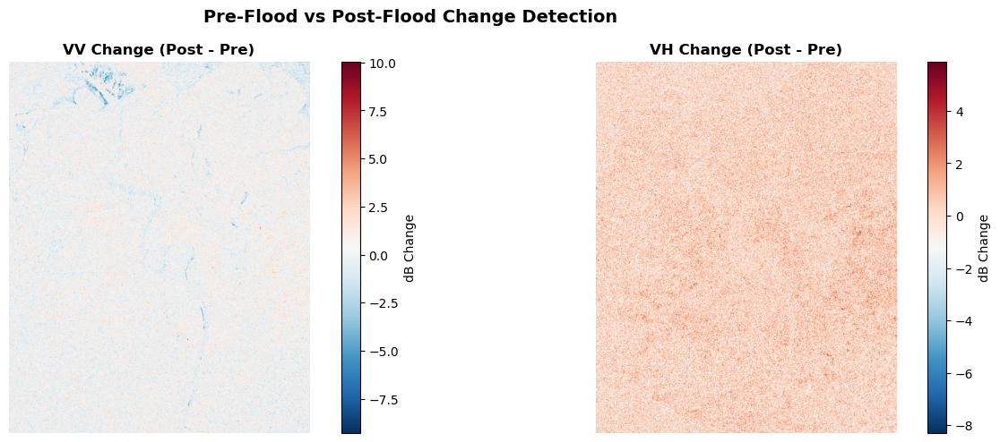


VV Change - Min: -9.29 dB, Max: 10.05 dB, Mean: 0.17 dB
VH Change - Min: -8.30 dB, Max: 5.89 dB, Mean: 0.22 dB


In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

# Pre-flood data
vv_array = vv_db.values
vh_array = vh_db.values

# Post-flood data
postflood = ds_post.median(dim='time')
vv_post_array = postflood['vv'].values
vh_post_array = postflood['vh'].values

# Convert to dB
vv_post_db = 10 * np.log10(vv_post_array)
vh_post_db = 10 * np.log10(vh_post_array)

# Make sure they're 2D
if len(vv_post_db.shape) > 2:
    vv_post_db = vv_post_db.squeeze()
if len(vh_post_db.shape) > 2:
    vh_post_db = vh_post_db.squeeze()

# ============================================================
# RESIZE POST-FLOOD TO MATCH PRE-FLOOD SHAPE
# ============================================================
scale_factor = (vv_array.shape[0] / vv_post_db.shape[0], 
                vv_array.shape[1] / vv_post_db.shape[1])

vv_post_db = zoom(vv_post_db, scale_factor, order=1)
vh_post_db = zoom(vh_post_db, scale_factor, order=1)

print(f"Pre-flood shape: {vv_array.shape}")
print(f"Post-flood shape (resized): {vv_post_db.shape}")

# ============================================================
# CALCULATE DIFFERENCE
# ============================================================
vv_change = vv_post_db - vv_array
vh_change = vh_post_db - vh_array

# ============================================================
# PLOT DIFFERENCE
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# VV Change
im1 = axes[0].imshow(vv_change, cmap='RdBu_r')
axes[0].set_title('VV Change (Post - Pre)', fontsize=12, fontweight='bold')
axes[0].axis('off')
plt.colorbar(im1, ax=axes[0], label='dB Change')

# VH Change
im2 = axes[1].imshow(vh_change, cmap='RdBu_r')
axes[1].set_title('VH Change (Post - Pre)', fontsize=12, fontweight='bold')
axes[1].axis('off')
plt.colorbar(im2, ax=axes[1], label='dB Change')

fig.suptitle('Pre-Flood vs Post-Flood Change Detection', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Print statistics
print(f"\nVV Change - Min: {vv_change.min():.2f} dB, Max: {vv_change.max():.2f} dB, Mean: {vv_change.mean():.2f} dB")
print(f"VH Change - Min: {vh_change.min():.2f} dB, Max: {vh_change.max():.2f} dB, Mean: {vh_change.mean():.2f} dB")

## 5.0 Digital Elevation Model

In [61]:
from odc.stac import load
from pystac_client import Client

# Open Element84 STAC
e84_catalog = "https://earth-search.aws.element84.com/v1/"
e84_client = Client.open(e84_catalog)

# Search DEM tiles covering your study area
items = e84_client.search(
    collections=["cop-dem-glo-30"],
    bbox=list(ds_post.odc.geobox.geographic_extent.boundingbox)
).item_collection()

# Load DEM
elevation = load(
    items,
    measurements=["data"],
    geobox=ds_post.odc.geobox
).squeeze()

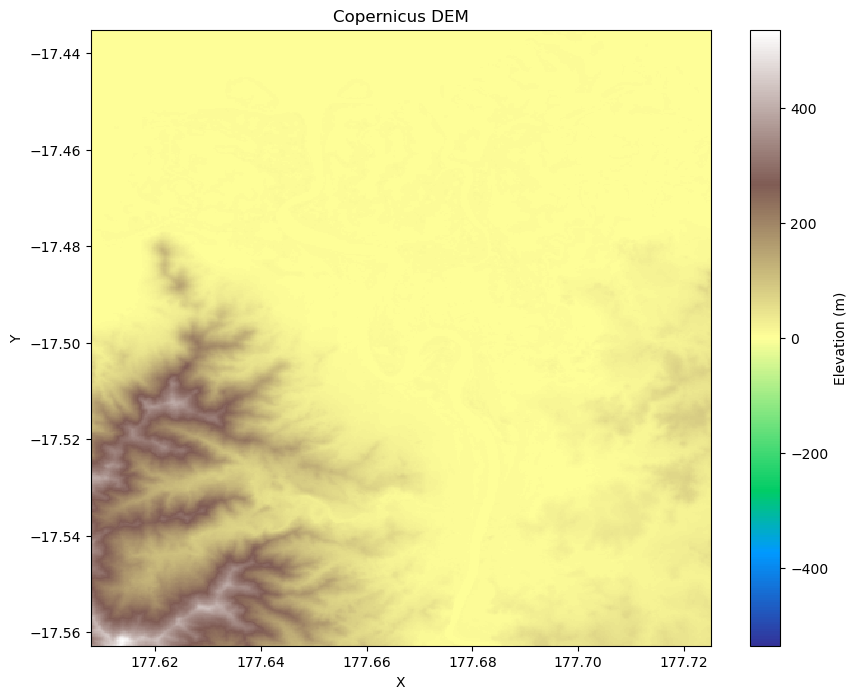

In [62]:
plt.figure(figsize=(10, 8))

elevation.data.plot(
    cmap="terrain",
    cbar_kwargs={"label": "Elevation (m)"}
)

plt.title("Copernicus DEM")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

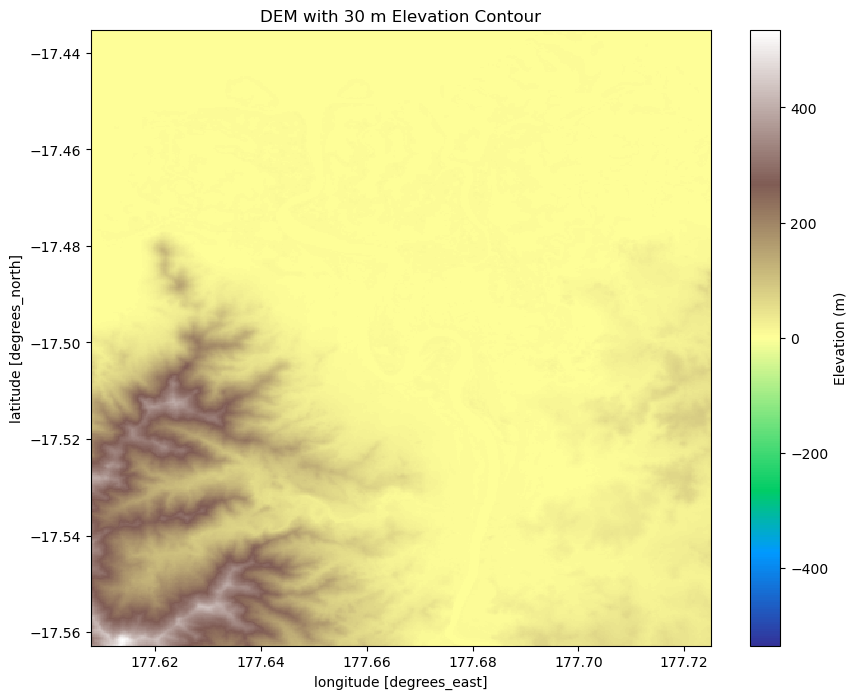

In [63]:
#To show the 30m threshold
plt.figure(figsize=(10, 8))

elevation.data.plot(
    cmap="terrain",
    cbar_kwargs={"label": "Elevation (m)"}
)

plt.contour(
    elevation.data,
    levels=[30],
    colors="red",
    linewidths=2
)

plt.title("DEM with 30 m Elevation Contour")
plt.show()

In [49]:
#Define the masking function
from masking import mask_elevation

In [55]:
#Mask
_, elev_mask = mask_elevation(
    ds=ds_post,
    threshold=30,
    return_mask=True
)

In [56]:
print(vh_post_array.shape)
print(elev_mask.shape)


(1211, 976)
(1211, 976)


In [58]:
vh_post_db_30m = np.where(~elev_mask, vh_post_array, np.nan)

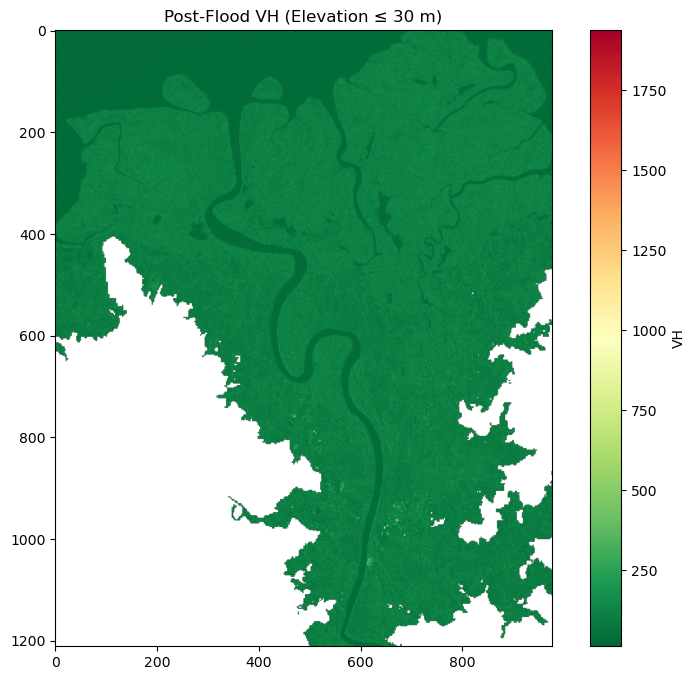

In [65]:
plt.figure(figsize=(10, 8))
plt.imshow(vh_post_db_30m, cmap="RdYlGn_r")
plt.colorbar(label="VH")
plt.title("Post-Flood VH (Elevation ≤ 30 m)")
plt.show()

## 6.0 Ocean Mask

In [68]:
#Ocean mask
vh_post_lee

array([[0.16654965, 0.17097973, 0.16520125, ..., 0.25632366, 0.25907549,
        0.25300248],
       [0.17348589, 0.18129984, 0.18881852, ..., 0.25195034, 0.24758769,
        0.24602186],
       [0.1881757 , 0.18659701, 0.17431037, ..., 0.23771241, 0.21861848,
        0.24739718],
       ...,
       [0.59302765, 0.5802443 , 0.55229289, ..., 0.44271884, 0.45883904,
        0.45514051],
       [0.59704423, 0.56718807, 0.56666777, ..., 0.44709562, 0.45826913,
        0.44963617],
       [0.58908876, 0.59208417, 0.59792315, ..., 0.4469277 , 0.45398774,
        0.45153686]])

## 7.0 Soil Moisture Estimation

### 7.1 Pre-flood

In [24]:
pre_vv = pre_s1.mean()

post_vv = post_s1.mean()

NameError: name 'pre_s1' is not defined

### 7.2 Post-flood

## 8.0 Soil Moisture Change Detection

## 9.0 Flood Mapping Using NDWI

In [ ]:
### 5. Map Pre-FloodSoil Moisture

#### Display Map

In [ ]:
display(Map)

### 6. Map Post-Flood Soil Moisture

#### Display Map

In [ ]:
display(Map)

## 10.0 Soil Moisture Change Detection
This is the most important section.
This section include:

- Overlay map
- Interpretation
- Areas of agreement/disagreement

In [ ]:
soil_moisture_change = (
    post_smi.subtract(pre_smi)
)

### 9. Flood Mapping Using NDWI
Calculate NDWI from Sentinel-2.

### 8. Visualize

In [ ]:
Map.addLayer(
    soil_moisture_change,
    {
        'min':-3,
        'max':3,
        'palette':
        ['red','white','blue']
    },
    'Moisture Change'
)

In [ ]:
pre_ndwi = (
    pre_s2.mean()
    .normalizedDifference(['B3','B8'])
)

post_ndwi = (
    post_s2.mean()
    .normalizedDifference(['B3','B8'])
)

### 10. Compare Soil Moisture and Flood Extent
This is the key analysis chapter.

## Interpreting Results

Flood impacts can be classified into three categories:

1. Open Floodwater
2. Waterlogged Soils
3. Unaffected Land
    
| Condition        | Soil Moisture Change | NDWI |
| ---------------- | -------------------- | ---- |
| Open Floodwater  | High                 | High |
| Waterlogged Soil | High                 | Low  |
| Dry Land         | Low                  | Low  |


In [ ]:
## 11. Agricultural Assessment
## Agricultural Impact Assessment

Areas exhibiting high soil moisture increases and high NDWI values are likely to represent flooded agricultural land.

Areas exhibiting increased soil moisture but low NDWI values may indicate waterlogged soils, which can negatively affect crop productivity even after floodwaters have receded.

These results help identify locations requiring post-flood recovery efforts and support agricultural planning within Yalelevu.

## Conclusion

The integration of Sentinel-1 VV backscatter and Sentinel-2 NDVI enabled the assessment of soil moisture conditions before and after the flood event in Yalelevu.

Results showed notable increases in soil moisture following flooding, particularly within low-lying areas adjacent to the Ba River. Comparison with NDWI-derived flood extent allowed differentiation between inundated areas and waterlogged soils.

The methodology demonstrates the value of combining radar and optical Earth observation datasets for flood impact assessment and agricultural monitoring in Fiji.